<a href="https://colab.research.google.com/github/Living-with-machines/image-search/blob/main/02_image_search_demo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Exploring image search results

This notebook is focused on exploring the results we get when using CLIP for image search. The focus here is on 'playing' with the model rather than performing a systematic evaluation of the model.

We start by installing the required packages

In [1]:
%%capture
!pip install datasets pillow rich faiss-cpu sentence_transformers gradio

We then import the `load_dataset` function and pass in the dataset we want to load. In this case we use a dataset which already has embeddings for each image in our dataset. 

In [2]:
from datasets import load_dataset

ds_with_embeddings = load_dataset("davanstrien/embellishments-sample")

Downloading:   0%|          | 0.00/2.70k [00:00<?, ?B/s]

Using custom data configuration davanstrien--embellishments-sample-ef6980a36e93e3f2


Extracting data files:   0%|          | 0/1 [00:00<?, ?it/s]

Dataset parquet downloaded and prepared to /root/.cache/huggingface/datasets/parquet/davanstrien--embellishments-sample-ef6980a36e93e3f2/0.0.0/0b6d5799bb726b24ad7fc7be720c170d8e497f575d02d47537de9a5bac074901. Subsequent calls will reuse this data.


  0%|          | 0/1 [00:00<?, ?it/s]

We can take a quick look at our data to see what this looks like. This also gives us a quick chance to explore some of the features of the 🤗 `datasets` library. First let's just see what our `ds_with_embeddings` variable looks like

In [3]:
ds_with_embeddings

DatasetDict({
    train: Dataset({
        features: ['image', 'label', 'fname', 'embeddings'],
        num_rows: 10000
    })
})

We get back something called a `DatasetDict`. We can probably guess from the name that this is some tpye of dictionary containing data. In this case we see something called `train` as one of the keys in our dictionary. If you have come across machine learning before you are probably at least vaguely familiar with training/validation/test data 'splits'. In this case we only have a `train` split since we're not actually training a model. 

In Python we normally access a dictionary using it's key, for example

In [6]:
sounds = {"dog": "woof", "cat": "meow"}
sounds["dog"]

'woof'

We can do the same with `datasets`

In [7]:
ds_with_embeddings['train']

Dataset({
    features: ['image', 'label', 'fname', 'embeddings'],
    num_rows: 10000
})

This gives us back a `Dataset` which has some 'features'. We can also see the number of rows our data has. To see our features in some more detail we can access the `features` attribute of our `Dataset`. 

In [8]:
ds_with_embeddings['train'].features

{'embeddings': Sequence(feature=Value(dtype='float32', id=None), length=-1, id=None),
 'fname': Value(dtype='string', id=None),
 'image': Image(decode=True, id=None),
 'label': ClassLabel(num_classes=210, names=['1540', '1593', '1602', '1607', '1623', '1630', '1631', '1633', '1634', '1635', '1636', '1637', '1638', '1639', '1640', '1641', '1643', '1648', '1656', '1661', '1662', '1664', '1665', '1670', '1675', '1681', '1683', '1688', '1689', '1690', '1691', '1695', '1704', '1710', '1714', '1716', '1717', '1718', '1719', '1720', '1721', '1722', '1723', '1724', '1725', '1727', '1728', '1729', '1730', '1731', '1732', '1733', '1734', '1735', '1736', '1737', '1738', '1739', '1740', '1742', '1743', '1744', '1746', '1747', '1748', '1749', '1750', '1751', '1753', '1754', '1755', '1756', '1757', '1759', '1760', '1761', '1762', '1765', '1766', '1767', '1768', '1769', '1770', '1771', '1772', '1773', '1774', '1775', '1776', '1777', '1778', '1780', '1781', '1782', '1783', '1785', '1787', '1788', '178

We won't dwell on this for too long but you can hopefullu already see that these different features represent different types of data. For example `fname` is a `string` and `image` is an `Image`. 

To make it more clear what our data looks like we can index into a single example. 

In [9]:
ds_with_embeddings['train'][0]

{'embeddings': [-0.8381683230400085,
  0.08047682046890259,
  0.14165042340755463,
  -0.020907744765281677,
  0.9215831160545349,
  -0.3706042170524597,
  0.023109368979930878,
  0.010554522275924683,
  0.12243110686540604,
  -0.08496737480163574,
  0.26178839802742004,
  -0.06287436932325363,
  0.7667280435562134,
  -0.006895255297422409,
  0.0458371639251709,
  -0.4385920464992523,
  0.11291167140007019,
  0.1341448277235031,
  0.19627566635608673,
  -0.061585620045661926,
  0.8032616972923279,
  -0.018030844628810883,
  0.011481262743473053,
  0.4155292510986328,
  0.23270857334136963,
  -0.08030049502849579,
  0.08422625809907913,
  -0.13840478658676147,
  -0.24953609704971313,
  -0.1039271205663681,
  0.08960956335067749,
  0.1274338811635971,
  0.1051066666841507,
  -0.006800197064876556,
  -0.34131965041160583,
  0.40632498264312744,
  0.3790496289730072,
  0.33329319953918457,
  -0.11467893421649933,
  0.17173784971237183,
  -0.2658871114253998,
  -0.17791533470153809,
  -0.286

There is quite a loot to look at here! Since the column  for embeddings doesn't mean much to the human eye. Let's index into a specific column from the first row. We do this by first indexing into the first row and then indexing into the column we're interested in. 

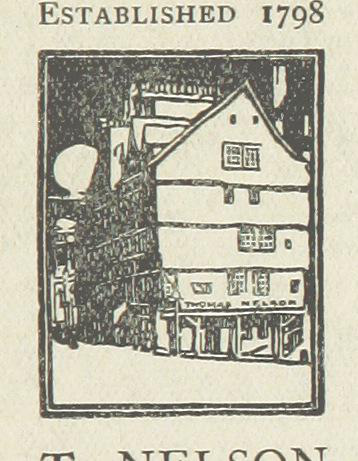

In [10]:
ds_with_embeddings['train'][0]['image']

There is a bunch more we can do with `datasets` but for now we've got some sense of how we can index into the data. Let's move on to image searching!

Although we already have embeddings for our images we still need a model to encode our queries i.e. the text we want to search for. We can download this in the same way we saw previously.  

In [11]:
from sentence_transformers import SentenceTransformer, util

model = SentenceTransformer('clip-ViT-B-32')

Downloading:   0%|          | 0.00/690 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/4.03k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/525k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/316 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/605M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/389 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/604 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/961k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.88k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/116 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/122 [00:00<?, ?B/s]

ftfy or spacy is not installed using BERT BasicTokenizer instead of ftfy.


We have a new column which contains the embeddings for our images. We could manually search through these and compare it to some input embedding but `datasets` has an `add_faiss_index` method. This uses the [faiss](https://github.com/facebookresearch/faiss) library to create an efficient index for searching embeddings. For more background on this library you can watch this [YouTube video](https://www.youtube.com/embed/sKyvsdEv6rk). 

In [12]:
ds_with_embeddings['train'].add_faiss_index(column='embeddings')

  0%|          | 0/10 [00:00<?, ?it/s]

Dataset({
    features: ['image', 'label', 'fname', 'embeddings'],
    num_rows: 10000
})

## Image search

We now have everything we need to create a simple image search. We can use the same model we used to encode our images to encode some input text. This will act as the prompt we try and find close examples for. Let's start with 'a steam engine'. 

In [13]:
prompt = model.encode("A steam engine")

We can see what this looks like

In [14]:
prompt.shape

(512,)

In [15]:
prompt

array([-4.68397960e-02, -1.25237733e-01,  1.25165001e-01,  1.23583384e-01,
        5.36687486e-02, -2.80560791e-01,  2.89632976e-02, -9.63450253e-01,
       -1.52873099e-01, -3.83019447e-02,  9.01966169e-02, -5.84576428e-02,
        1.04645982e-01,  2.44443923e-01,  1.38233393e-01, -3.97523344e-02,
        4.35137272e-01, -4.26819548e-02, -8.48560929e-02, -6.94140270e-02,
        6.25562310e-01,  3.68572891e-01,  3.34365219e-01, -3.37864757e-01,
       -2.53632754e-01, -3.01467896e-01, -1.56483889e-01,  2.94869155e-01,
       -1.89204127e-01, -1.13111451e-01, -1.46938413e-02,  2.97405720e-01,
       -2.92488247e-01,  3.56931448e-01,  1.44009173e-01,  7.53009468e-02,
       -1.02462865e-01,  2.26309881e-01, -3.77506763e-01,  4.75440174e-02,
       -8.52121413e-03,  7.40274042e-03, -1.36876523e-01,  1.12041868e-01,
        3.65501672e-01, -9.37360376e-02,  1.00782119e-01, -3.86462390e-01,
       -1.39045134e-01, -2.31989384e-01, -2.62126595e-01,  8.75060409e-02,
       -9.87479240e-02,  

We can use another method from the `datasets` library `get_nearest_examples` to get images which have an embedding close to our input prompt embedding. We can pass in a number of results we want to get back. 

In [16]:
scores, retrieved_examples = ds_with_embeddings['train'].get_nearest_examples('embeddings', prompt,k=9)

We can index into the first example this retrieves:

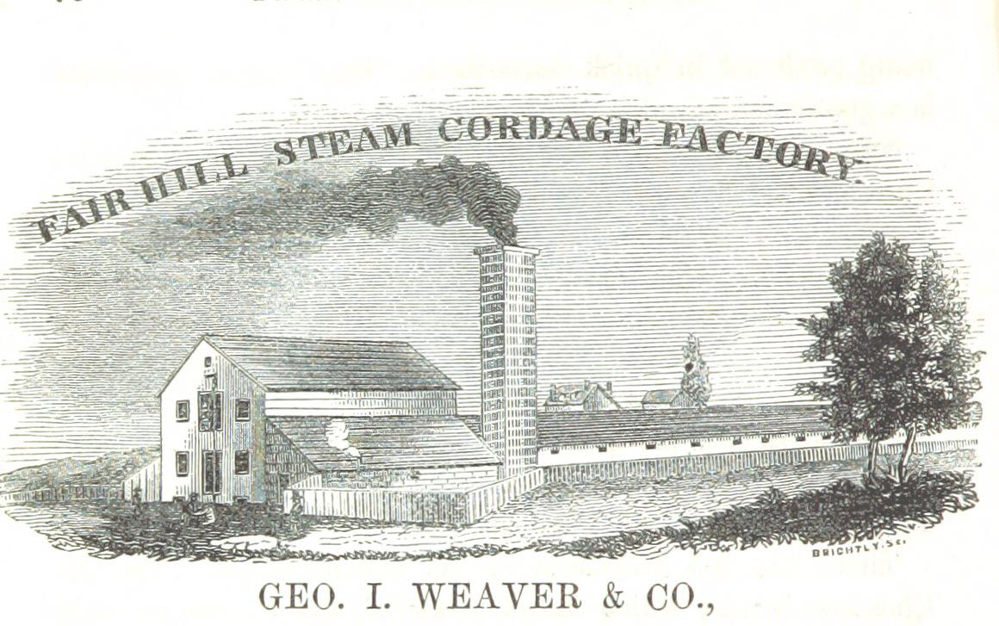

In [17]:
retrieved_examples['image'][0]

This isn't quite a steam engine but it's also not a completely weird result. We can plot the other results to see what was returned. 

In [18]:
import matplotlib.pyplot as plt

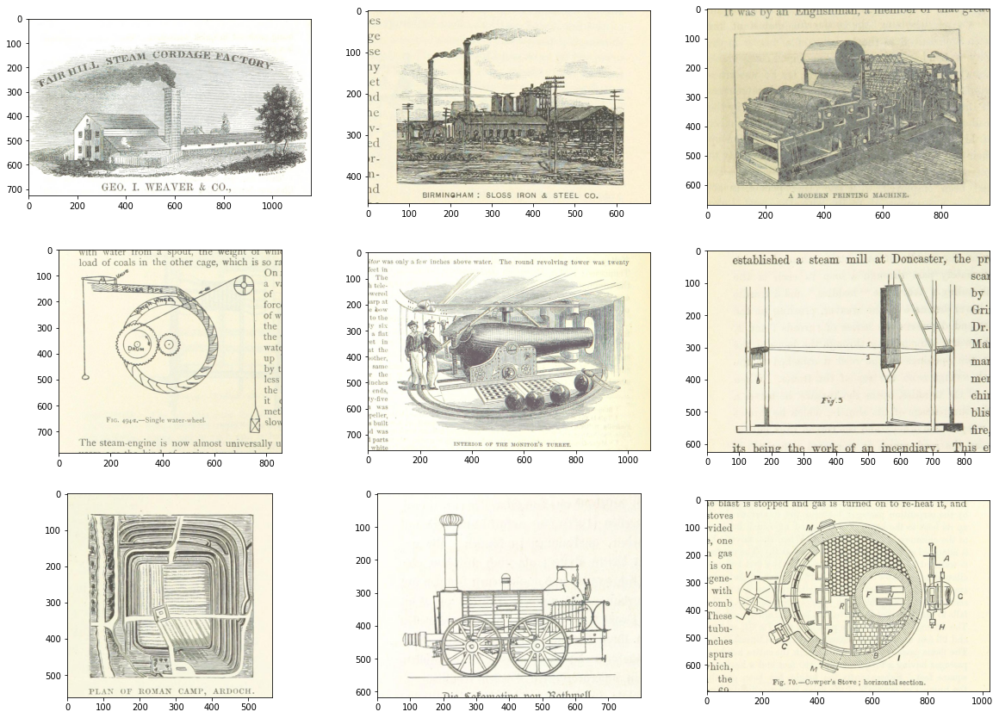

In [19]:
plt.figure(figsize=(20, 20))
columns = 3
for i in range(9):
    image = retrieved_examples['image'][i]
    plt.subplot(9 / columns + 1, columns, i + 1)
    plt.imshow(image)

Some of these results look fairly close to our input prompt. We can wrap this in a function so can more easily play around with different prompts

In [ ]:
def get_image_from_text(text_prompt, number_to_retrieve=9):
    prompt = model.encode(text_prompt)
    scores, retrieved_examples = ds_with_embeddings['train'].get_nearest_examples('embeddings', prompt,k=number_to_retrieve)
    plt.figure(figsize=(20, 20))
    columns = 3
    for i in range(9):
        image = retrieved_examples['image'][i]
        plt.title(text_prompt)
        plt.subplot(9 / columns + 1, columns, i + 1)
        plt.imshow(image)

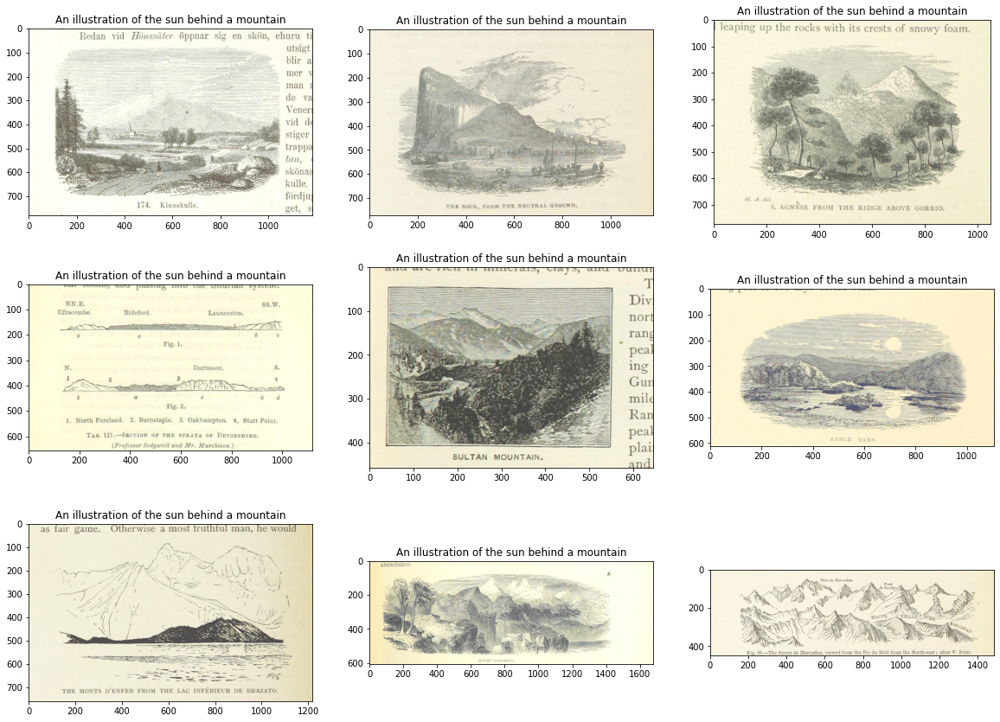

In [ ]:
get_image_from_text("An illustration of the sun behind a mountain")

### Trying a bunch of prompts ✨

Now we have a function for getting a few results we can try a bunch of different prompts:

- For some of these I'll choose prompts which are a broad 'category' i.e. 'a musical instrument' or 'an animal', others are specific i.e. 'a guitar'. 

- Out of interest I also tried a boolean operator:  "An illustration of a cat or a dog". 

- Finally I tried something a little more abstract: "an empty abyss"

In [ ]:
prompts = ["A musical instrument", "A guitar", "An animal", "An illustration of a cat or a dog", "an empty abyss"]

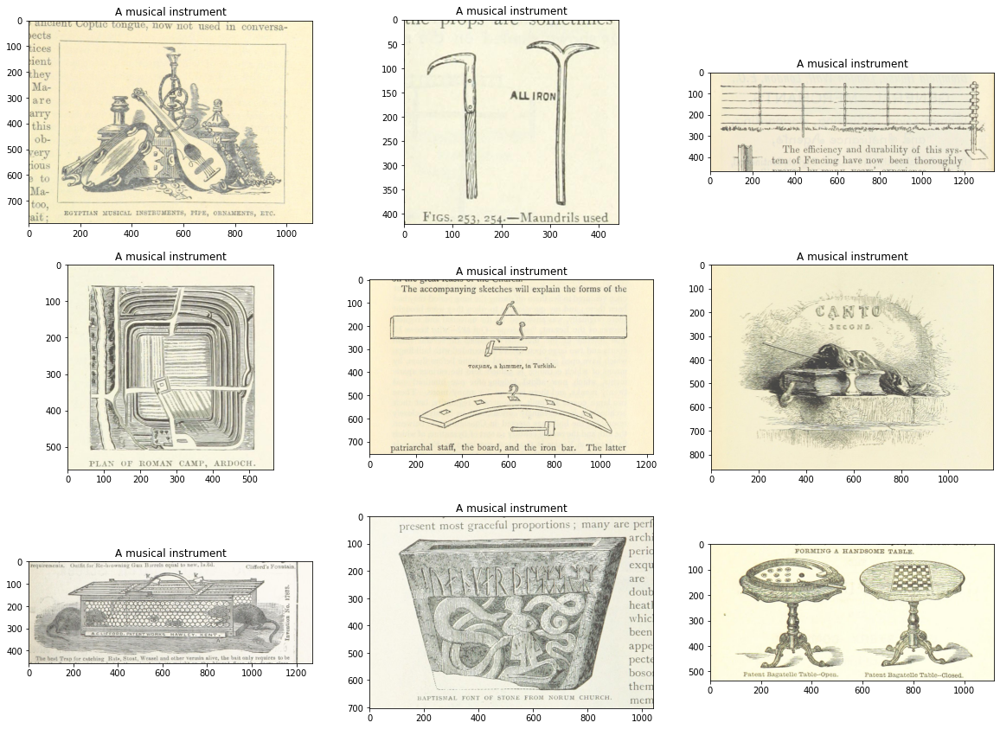

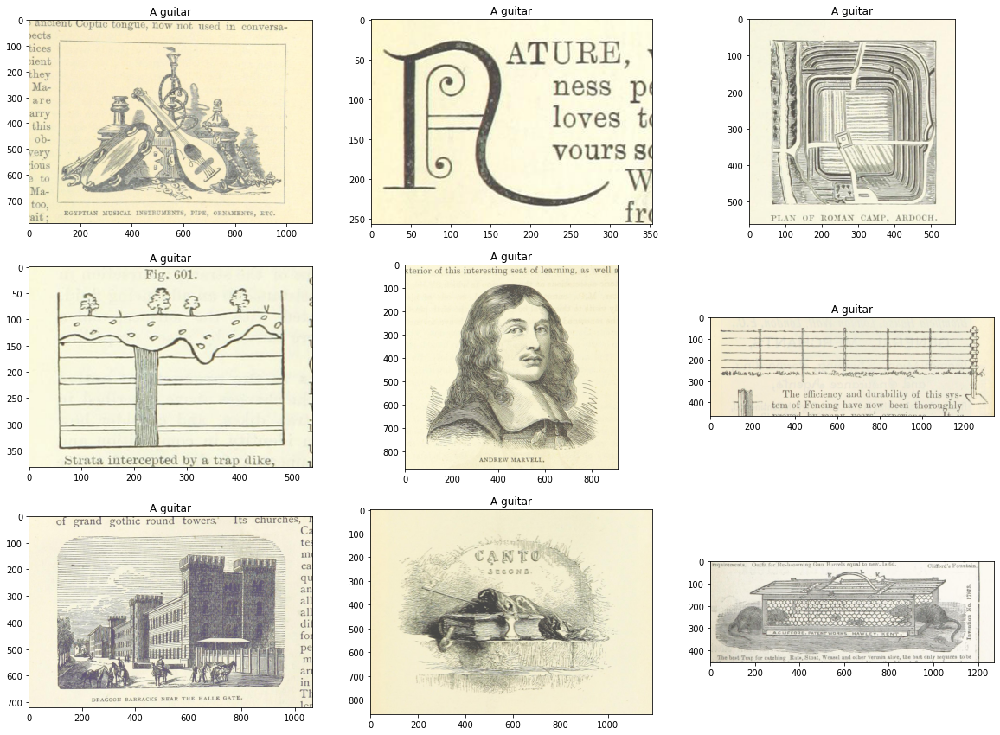

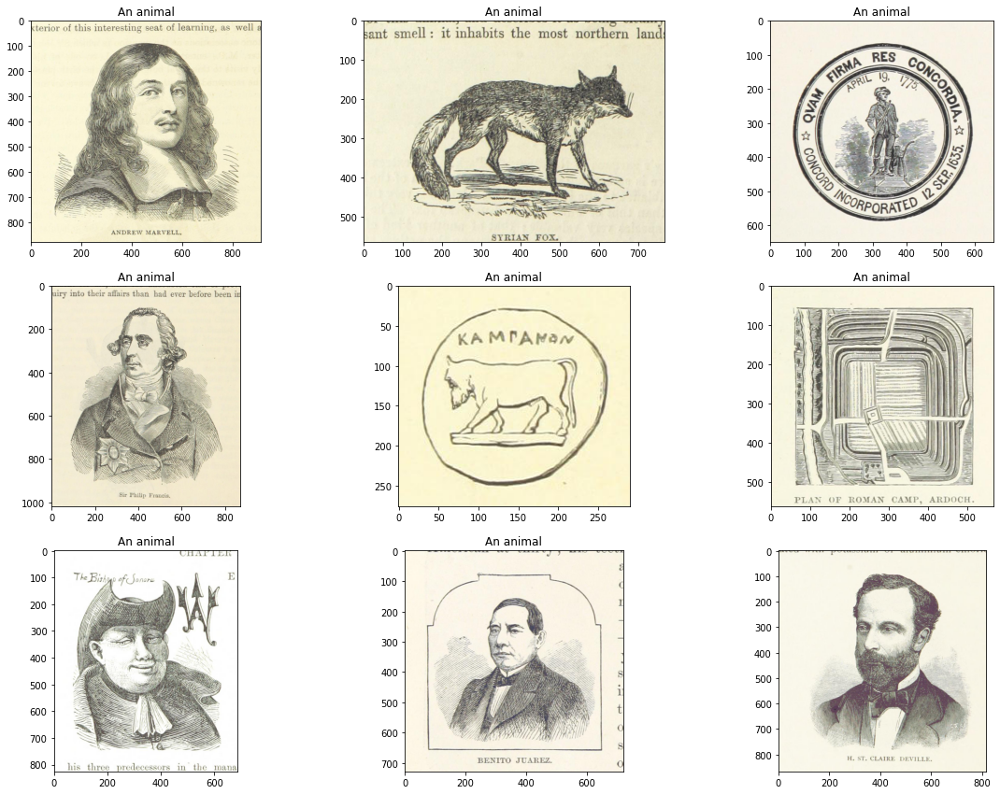

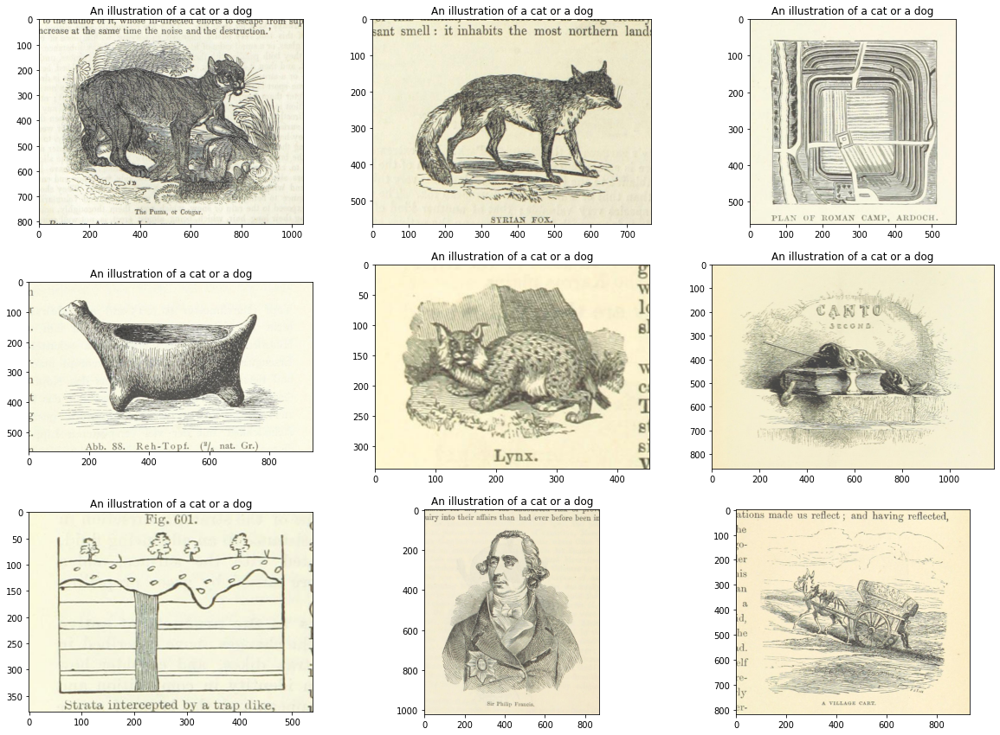

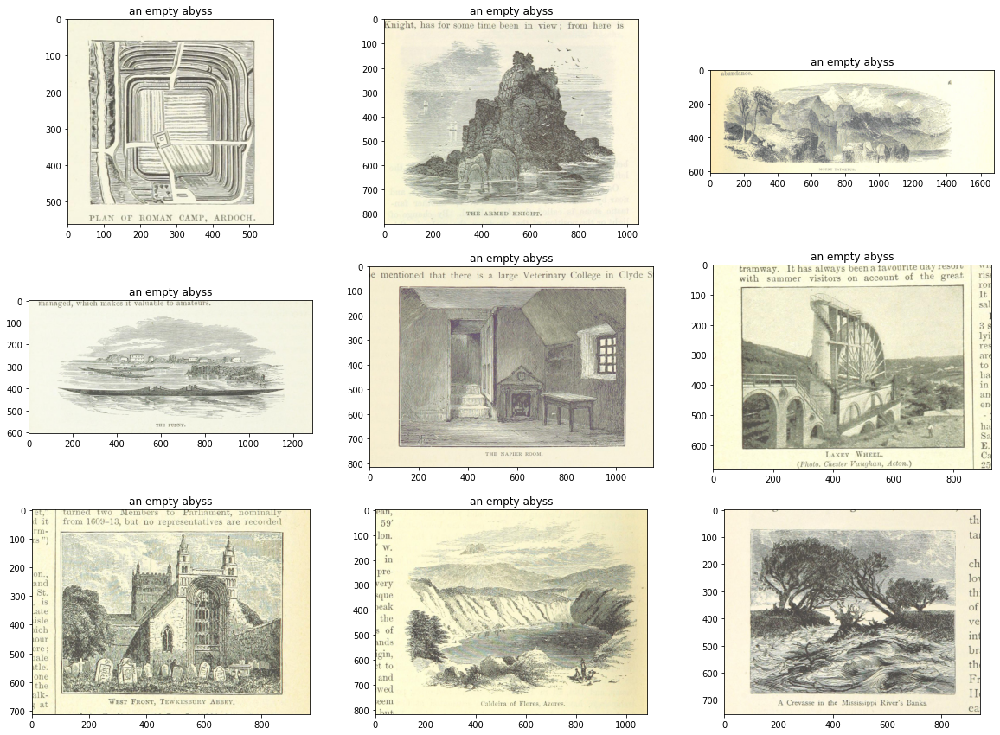

In [ ]:
for prompt in prompts:
    get_image_from_text(prompt)

# Creating a gradio app for this...

[gradio](https://gradio.app/) is a fantastic tool for making machine learning demos. We could create an app for doing this with our dataset. 

First we need to import a few more libraries. 

In [23]:
import pandas as pd
import gradio as gr
from gradio import outputs
from pathlib import Path

We can also get some additional metadata about our books from the British Library repository 😀

In [24]:
df = pd.read_csv("https://bl.iro.bl.uk/downloads/e4bf0f74-2c64-4322-93c7-0dcc5e5246da?locale=en",
                 dtype={"BL record ID":"string"}, low_memory=False)

In [25]:
df

,BL record ID,Type of resource,BNB number,ISBN,Name,Dates associated with name,Type of name,Role,All names,Title,...,Publisher,Date of publication,Edition,Physical description,Dewey classification,BL shelfmark,Topics,Genre,Languages,Notes
0,000000004,Monograph,NaN,NaN,NaN,NaN,NaN,NaN,"Carlbohm, Johan Arvid, printer [person]","Aabc [etc.] Jesus Vocales, eli äänelliset boks...",...,präntätty directörin J.A. Carlbohmin tykönä,1800,NaN,"16 unnumbered pages, 17 cm (8°)",NaN,12976.aa.3,Writing ; Reading ; Writing--Alphabets--Primer...,NaN,Finnish,"Finnish primer, beginning with the Lord's pray..."
1,000000006,Monograph,NaN,NaN,NaN,NaN,NaN,NaN,NaN,A che serve il Papa?,...,Tiberina,1889,NaN,"32 pages, 14 cm",NaN,3900.aaa.20. (4.),NaN,NaN,Italian,NaN
2,000000007,Monograph,NaN,NaN,NaN,NaN,NaN,NaN,NaN,A. for Apple [An illustrated alphabet.],...,Ward & Lock,1894,NaN,NaN,NaN,12811.h.70,NaN,NaN,NaN,NaN
3,000000008,Monograph,NaN,NaN,NaN,NaN,NaN,NaN,England [organisation],Á Grãa Bretanha,...,NaN,1808,NaN,pages not numbered (4°),NaN,74/B.P.26/9. (8.) ; 74/B.P.26/9. (9.),NaN,NaN,NaN,Poems. Printed on one side of the leaf only
4,000000013,Monograph,NaN,NaN,NaN,NaN,NaN,NaN,NaN,A quien me entiende [On the factious spirit of...,...,NaN,1826,NaN,NaN,NaN,9770.bb.18. (21.),NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1752073,020152342,Monograph,NaN,NaN,"Rossi, Gaetano",1774-1855,person,author,"Mayr, Giovanni Simone, 1763-1845 [person] ; Ro...",Ginevra di Scozia : melodramma eroico : da rap...,...,per li frat. Conzatti e comp,1806,NaN,"62 pages, 18 cm",782.10268,NaN,Operas--Librettos--19th century,Libretto,Italian,"'Dedicato al signatures Girolamo Polcastro, ca..."
1752074,020152344,Monograph,NaN,NaN,"Rossi, Gaetano",1774-1855,person,author,"Mayr, Giovanni Simone, 1763-1845 [person] ; Ro...",I virtuosi di teatro : dramma giocoso di un so...,...,dalla tipografia Casali,1819,NaN,"32 pages, 18 cm",782.10268,NaN,Operas--Librettos--19th century,Libretto,Italian,Composer's name from page 3; librettist's name...
1752075,020152347,Monograph,NaN,NaN,"Rossi, Gaetano",1774-1855,person,author,"Mayr, Giovanni Simone, 1763-1845 [person] ; Te...",Eraldo ed Emma : dramma eroico per musica in d...,...,dalla tipografia Pirola,1805,NaN,"60 pages, 17 cm",782.10268,NaN,Operas--Librettos--19th century ; Ballets--19t...,Libretto,Italian,Original Italian libretto written by Gaetano R...
1752076,020152373,Monograph,NaN,NaN,"Rossi, Gaetano",1774-1855,person,author,"Rossi, Gaetano, 1774-1855, author [person] ; G...",Il ventaglio : farsa comica in musica : da rap...,...,"fratelli Conzatti e comp, con lic. de' Sup",1803,NaN,"40 pages, illustrations, 18 cm",782.10268,NaN,Operas--Librettos--19th century,Libretto,Italian,Original Italian libretto written by Gaetano R...


We won't cover all the steps here in great detail but we essentially need to create a function that does our predictions and returns some results. This looks similar to what we had before. We also need to specify in Gradio what our inputs and outputs are. 

We can use the `launch` method to see what this interface looks like. 

In [ ]:

def search(prompt):
    prompt = model.encode(prompt)
    scores, retrieved_examples = ds_with_embeddings['train'].get_nearest_examples('embeddings', prompt,k=5)
    results = [retrieved_examples['image'][i] for i in range(5)]
    retrieved_examples_paths = (retrieved_examples['fname'][i] for i in range(5))
    retrieved_examples_ids = (Path(path).name.split("_")[0] for path in retrieved_examples_paths)
    metadata = [df[df['BL record ID']==f"{id_}"][['Title','Date of publication']] for id_ in retrieved_examples_ids]
    all_results = []
    for img, html in zip(results, metadata):
        all_results.append([img, html])

    return all_results
    
iface = gr.Interface(fn=search, inputs='text', outputs=outputs.Carousel(['image','dataframe']), live=False, flagging_dir='.')
iface.launch(debug=True)

Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
Running on public URL: https://39784.gradio.app

This share link expires in 72 hours. For free permanent hosting, check out Spaces (https://huggingface.co/spaces)


We can see these results aren't always right but they are usually some reasonable results in there. It already seems like this could be useful for searching for a the semantic content of an image in this dataset. However we might hold off on sharing this as is...